# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Rensorflow 2.0 and tensorFlow Hub.

## 1. Problem
Identifying the breed if the dog given an image of a dog

When i'm sitting a the cafe and I take a photo of  dog, I want to know what breed of dog it is
## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probability for each dog breed of each image.

https://www.kaggle.com/competitions/dog-breed-identification/overview

## 4. Features

Some information about the data:
* We are dealing with images (unstructured data) so it's probably best we use deep learning/transfer learing.
* There are 120 breeds (this means there are 120 different classes).
* There are around 10,000+ images in the training set
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)


In [ ]:
# Unzip the uploaded data into google Drive
# !unzip "drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision"

### Get our workspace ready

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# import Tensorflow into Colab

import tensorflow as tf
print ("TF version:", tf.__version__)

TF version: 2.13.0


In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print ("TF version:", tf.__version__)
print ("TF version:", hub.__version__)

# Check for GPU availability
print ("GPU", "available(Yes!)"if tf.config.list_physical_devices("GPU")else"not available")

TF version: 2.13.0
TF version: 0.14.0
GPU available(Yes!)


## Getting our dATA READY(TuRINING INTO tENSORS)

In [ ]:
# checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/My Drive/Dog Vision/labels.csv')
print (labels_csv.describe())
print (labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head

<bound method NDFrame.head of                                      id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]>

<Axes: >

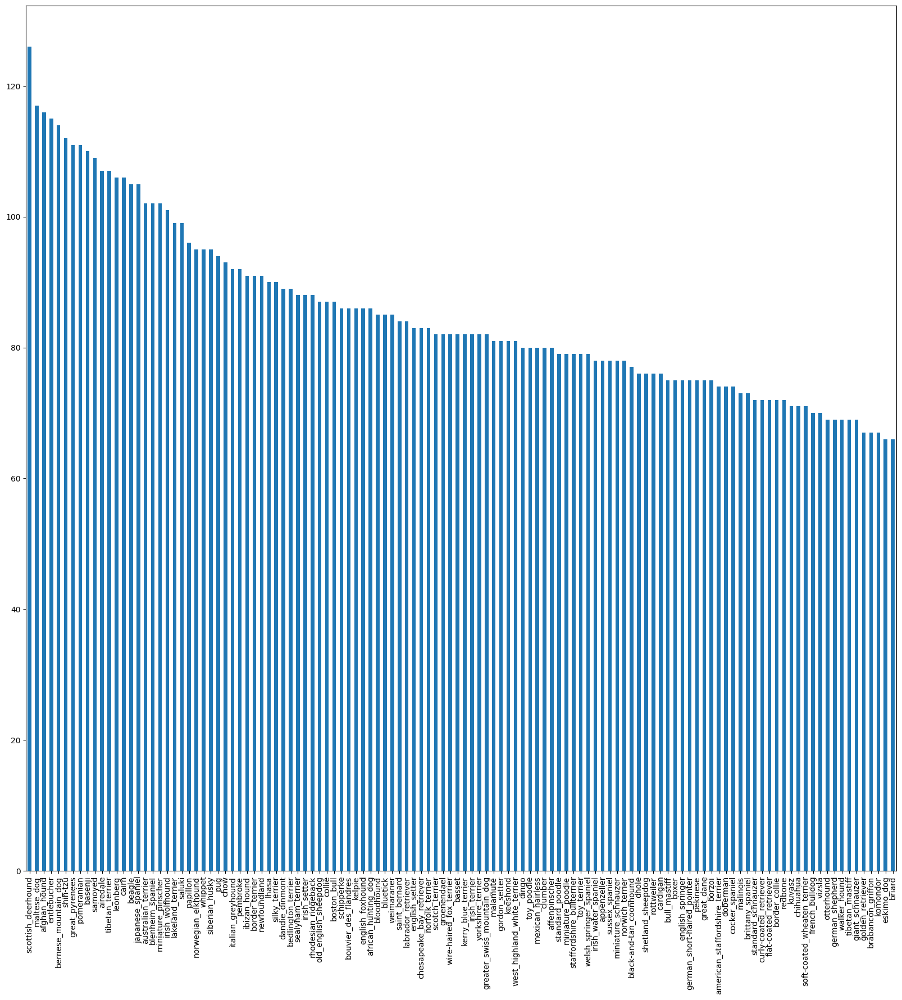

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,20))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

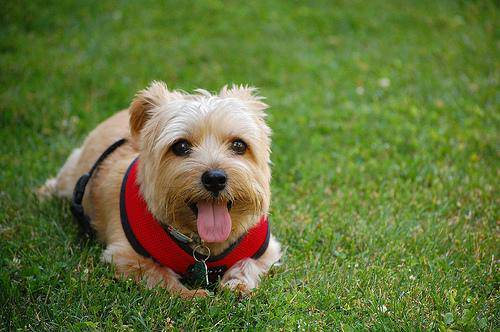

In [ ]:
# lets view an image
from IPython.display import Image
Image('drive/My Drive/Dog Vision/train/0075dc49dab4024d12fafe67074d8a81.jpg')



## Getting Images and their labels





Lets get a list of all our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from ID's
# filenames = [fnames for fnames in labels_csv['id']]


# filenames

filenames = ['drive/My Drive/Dog Vision/train/' + fnames + '.jpg' for fnames in labels_csv['id']]
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number if actual image files
import os
if len(os.listdir('drive/My Drive/Dog Vision/train/')) == len(filenames):
  print ('Filenames match actual amount of files!! proceeed.')
else:
  print ('filenames do not match actual amount of files check the target directory')

Filenames match actual amount of files!! proceeed.


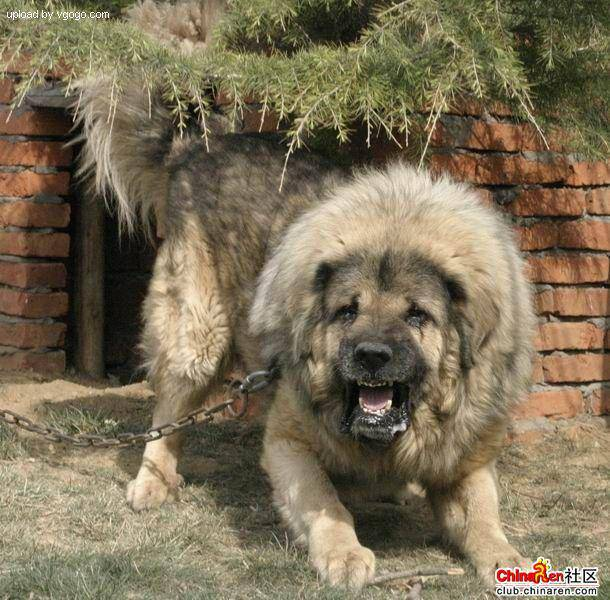

In [ ]:
# One more heck
Image(filenames[9000])

In [ ]:
labels_csv.breed[9000]

'tibetan_mastiff'

since we have now gotten our trainining image filepaths in a list, lets prepare our labels

In [ ]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# see if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print ('Number of labels matches number of filenames!')
else:
   ('number of labels does not match number of filenames, check data directories!')

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
import numpy as np
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print (labels[0])
labels[0] == unique_breeds


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean arrau
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original lable
print (np.where(unique_breeds == labels[0])) # index where label occures
print (boolean_labels[0].argmax()) # index where label occurs in boolean array
print (boolean_labels[0].astype(int)) # ther will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print (labels[9000])
print (boolean_labels[9000].astype(int))

tibetan_mastiff
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

##             ============================ END OF EDA ================================

### Creating our own validation set
since our dataset form kaggle does not come with a validation set, we're going to create pour own

In [ ]:
## Setup X and Y variables
X = filenames
y = boolean_labels

In [ ]:
len (filenames)

10222

we are going to start of exerimenting 1000 images and increase a needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param{type:'slider', min:1000, max:10000, step:1000}

In [ ]:
# lets plit our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Lets have a geez at the training data
X_train[:2], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

## `Preprocessing images turing images into tensors`

To preprocess our images into tensors we are sgoing to write a function that does a few things:
1. take an image file path as input
2. Use TensorFlow to read the file and save it into a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. return the modified `image`


Brfore we do lets see what importing an image looks like

In [ ]:
# Convert an image to Numpy array

from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we have seen what an image looks like as a tensor lets make a function to preprocess them.


## `Preprocessing images turing images into tensors`

To preprocess our images into tensors we are sgoing to write a function that does a few things:
1. take an image file path as input
2. Use TensorFlow to rea the file and save it into a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. normalize our image (convert our color channel values from 0-255 to 0-1).
4. Resize the `image` to be a shape of (224, 224)
5. return the modified `image`


Brfore we do lets see what importing an image looks like

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
   Takes an image file path and turns the image into a tensor
  """
  # Read in an image file into a format the computer can understands
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels Red green blue (this increases the size of the image)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values from 0-255 to 0-1 values (this is done to save on memory)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(244, 244) (this is also done to save on memory, upto 75%)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
# this code basically converts the image into a format the computer can understand
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor = tf.image.decode_jpeg(tensor, channels=3)
tensor

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [ ]:
# Converting to float32 to save on memory
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

## Turing our data into batches

why turn our data into batches

lets say you are trying to process 10,000+ images in one go... they may not fit into memory.

S that';s why we do about 32 (this is batch size) images at a time( you can manually adjust the batch size if need be)

inorder to use tensorflow effectctivlely we need opur data in the forn f tensor tuples which look like this`(image, label)` <- this `(image, label)` is done for every 32 images in a loop fashion in a machine learning model and figure out the patterns of the `image` to the `label` until all 10,000+ images are done

In [ ]:
print(process_image((X[42]), tf.constant(y[42])))

tf.Tensor(
[[[0.3264178  0.5222886  0.3232816 ]
  [0.2537167  0.44366494 0.24117757]
  [0.25699762 0.4467087  0.23893751]
  ...
  [0.29325107 0.5189916  0.3215547 ]
  [0.29721776 0.52466875 0.33030328]
  [0.2948505  0.5223015  0.33406618]]

 [[0.25903144 0.4537807  0.27294815]
  [0.24375686 0.4407019  0.2554778 ]
  [0.2838985  0.47213382 0.28298813]
  ...
  [0.2785345  0.5027992  0.31004712]
  [0.28428748 0.5108719  0.32523635]
  [0.28821915 0.5148036  0.32916805]]

 [[0.20941195 0.40692952 0.25792548]
  [0.24045378 0.43900946 0.2868911 ]
  [0.29001117 0.47937486 0.32247734]
  ...
  [0.26074055 0.48414773 0.30125174]
  [0.27101526 0.49454468 0.32096273]
  [0.27939945 0.5029289  0.32934693]]

 ...

 [[0.00634795 0.03442048 0.0258106 ]
  [0.01408936 0.04459917 0.0301715 ]
  [0.01385712 0.04856448 0.02839671]
  ...
  [0.4220516  0.39761978 0.21622123]
  [0.47932503 0.45370543 0.2696505 ]
  [0.48181024 0.45828083 0.27004552]]

 [[0.00222061 0.02262166 0.03176915]
  [0.01008397 0.03669046 0

In [ ]:
# Create a simple function to return a tupple of tensors (image, label)

def get_image_label (image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)

  """
  image = process_image (image_path)
  return image, label

In [ ]:
print (X[42], y[42])
print(tf.constant(X[42]), tf.constant(y[42]))
print(process_image((X[42]), tf.constant(y[42])))

drive/My Drive/Dog Vision/train/011e06760794850c40f23d6426c40774.jpg [False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
  True False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
tf.Tensor(b'drive/My Drive/Dog Vision/train/011e06760794850c40f23d6426c40774.jpg', shape=(), dtype=string) tf.Tensor(
[False False False False False False False False False False False False
 False Fa

In [ ]:
# Demo of the above, tf.constant() turns a python object like a list or a numpy into a tensor (used on the label to make data manipulation between tensors possible)


(process_image (X[42]), tf.constant(y[42]))
# process_image (X[42], tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Demo of the above
process_image ((X[42]), y[42])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we've got a way to turn our data into tuples of Tensors
in the form: `(image, label)`, let's make a function to turn all of our data (`X` and `y`) INTO BATCHES!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches (X, y=None -> creates a databatch with no labels)

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  shuffles the data if it's training data but doesn't shuffle if it's validation data and test data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probabsly don't have labels
  if test_data:
    print('Creating test data batches...')
    # Creates a Dataset whose elements are slices of the given tensors.The given tensors are sliced along their first dimension.
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE) # The .map() function is used to iterate through eaech element in the data set making sure the process_image function is aplied
    return data_batch

    # If the data is a valid dataset, we don't need to shuffle it (we dont shuffle it because it introduces biasness, especially when the validation data is small
    # it can cause dome datapoints to be selectedmore than the othere. it is best to keep the validation dataset as original as possible)
  elif valid_data:
    print ('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                 tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # create (image, label) tuples (this also turns the image into a preprocesses image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch



In [ ]:
# data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
# data_batch = data.map(process_image).batch(BATCH_SIZE)
# data_batch = next(data_batch.as_numpy_iterator())
# data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches....
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend. lets visualize them

In [ ]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images, labels):

  """
  Displays a plot of 25 images and their labels from a databatch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range (25):
    # Create subplots(5rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [ ]:
train_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.31560814, 0.33671516, 0.21047537],
          [0.28051284, 0.30775547, 0.1857483 ],
          [0.16578984, 0.19756505, 0.08032066],
          ...,
          [0.08856081, 0.13820921, 0.05977784],
          [0.09093923, 0.14526527, 0.06516107],
          [0.08869048, 0.14751402, 0.06516107]],
 
         [[0.32700455, 0.35651964, 0.23495103],
          [0.20850335, 0.24205294, 0.12833877],
          [0.18762302, 0.22291715, 0.11351588],
          ...,
          [0.09698029, 0.13853738, 0.06193992],
          [0.1325866 , 0.1703983 , 0.09506303],
          [0.12584035, 0.1734944 , 0.09506303]],
 
         [[0.24710983, 0.29072556, 0.18403938],
          [0.14182165, 0.18275319, 0.0769364 ],
          [0.15548632, 0.20046924, 0.10098569],
          ...,
          [0.11003159, 0.13039842, 0.06211366],
          [0.14866087, 0.17523189, 0.10493698],
          [0.14807422, 0.1755252 , 0.10493698]],
 
         ...,
 
         [[0.19213268, 0.35805532, 0.0298499 ],
          [0.25509

In [ ]:
len(train_images), len(train_labels)

(32, 32)

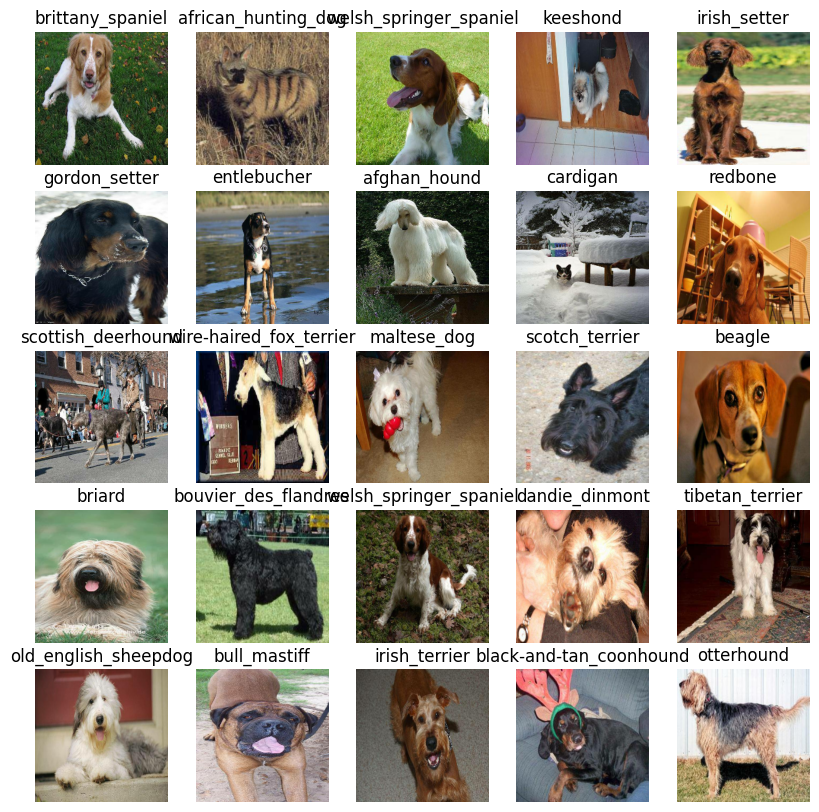

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

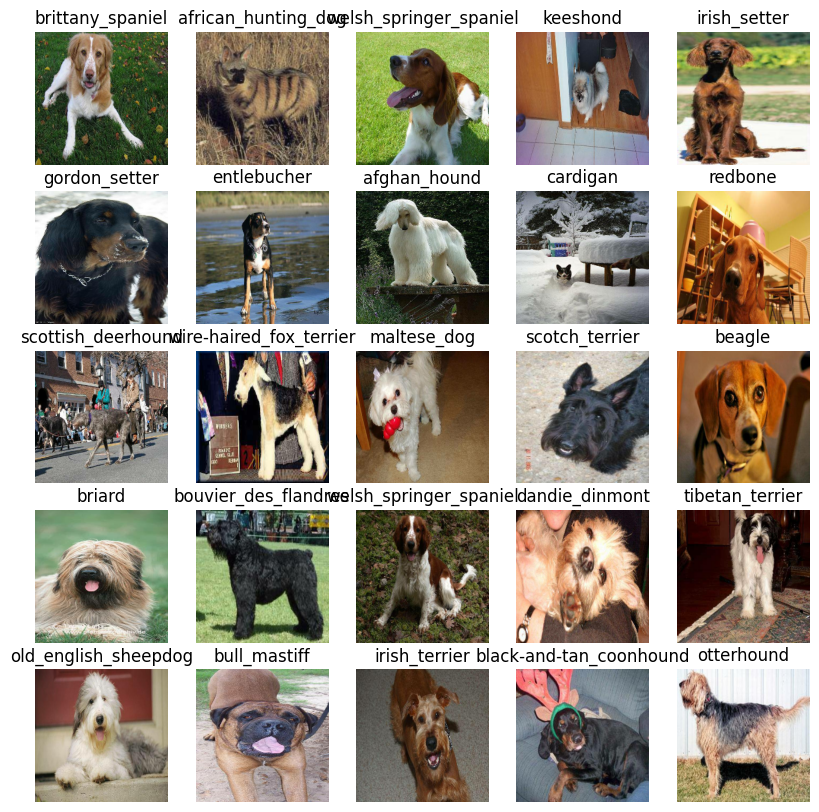

In [ ]:
show_25_images(train_images, train_labels)

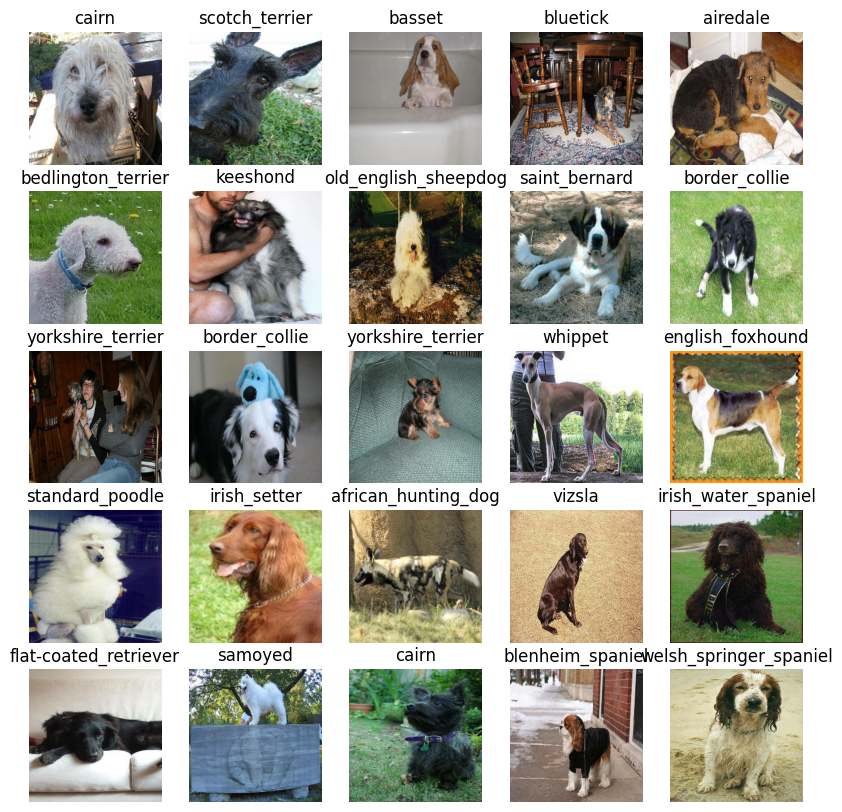

In [ ]:
# Now lets visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

##  This is called building a model

Before we build a model, there are a few things we need to define:
* The input shape( our images shape, in the form of Tensors) to our model.
* The outout shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from Tensroflow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

# Tranferlearning models
1. Tensorflow hub : https://tfhub.dev/
2. Paperwithcodes : https://paperswithcode.com/
3. ModelZoo :  https://modelzoo.co/
4. HuggingFace : https://huggingface.co/
5. PytorchHub : https://pytorch.org/hub/

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE,3] # batch, height, width, colour channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'


Now we've go pr inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model

Knowing this, let's create a function which:
* takes the input shape, output shape and the models we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this then that)
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [ ]:
# create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print ("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation='softmax') # Layer 2 (output layer) [softmax = 0, 1] the closer it is to 1 the higher the probability
  ])
  #  Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Categoricalcrossentropy is used when we have a classification problem with multiple classes
      optimizer=tf.keras.optimizers.Adam(), # Adam optimizer is used to guide the model
      metrics=['accuracy'] #used to calculate the metrics on how the model is performing
  )
  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
callbacks are helper function a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

we'll create two callbacks, one os for Tensorband which helps track our models progress and another for earlystopping which prevents our model from training a model for too long

## TensorBoard Callback

to setup a tensorboard call back we need to do three things:
1. Load the tensorboard notebook extention
2. Create a tensorboard callback whcich is able to save logs to a directory ad pass it to our model's `fit()` function (we'll do this after model training).

In [ ]:
# Load Tensorboard notebook extention
%load_ext tensorboard

In [ ]:
import datetime
# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # create a log directory for storing Tensorboard logs
  logdir = os.path.join('/content/drive/MyDrive/Dog Vision/logs',
  # Make it so the logs get racked whenever we run an experiment
  datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


In [ ]:
# Create ealy stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience = 3)

## Training a model(on subset of data)

our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param{type:'slider', min: 10, max:100}

In [ ]:
# Check to make sure we are still running on a GPU
print ('GPU', "available(YES!)" if tf.config.list_physical_devices('GPU') else "not available")

GPU available(YES!)


Let's create a function which trains a model
* create a model using ``create_model()``
* Setup a tensorboard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the trainning data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new ensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 152s 6s/step - loss: 4.5970 - accuracy: 0.1088 - val_loss: 3.5019 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 3s 105ms/step - loss: 1.6829 - accuracy: 0.6700 - val_loss: 2.2178 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 3s 107ms/step - loss: 0.5866 - accuracy: 0.9237 - val_loss: 1.6839 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 3s 104ms/step - loss: 0.2637 - accuracy: 0.9875 - val_loss: 1.5080 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 3s 137ms/step - loss: 0.1498 - accuracy: 0.9975 - val_loss: 1.4240 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 110ms/step - loss: 0.1035 - accuracy: 0.9987 - val_loss: 1.3740 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================]

## Checking the tensorboar logs

The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
pip install TensorRT

  Preparing metadata (setup.py) ... done
  Created wheel for TensorRT: filename=tensorrt-8.6.1.post1-py2.py3-none-any.whl size=17281 sha256=0bb7951a1fe00da8f5dfe510e6cc8259ecc9a21416b7e2240eae077f7c51a93d
  Stored in directory: /root/.cache/pip/wheels/f4/c8/0e/b79b08e45752491b9acfdbd69e8a609e8b2ed7640dda5a3e59
Successfully built TensorRT


In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

Reusing TensorBoard on port 6006 (pid 4741), started 0:03:47 ago. (Use '!kill 4741' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data(not used to train on)
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 24s 83ms/step


array([[5.3542666e-03, 6.9069400e-05, 1.1724086e-03, ..., 1.6464110e-04,
        5.0723018e-05, 1.8908464e-03],
       [3.5677361e-03, 1.4168755e-03, 6.8384479e-03, ..., 2.9666515e-04,
        6.3892277e-03, 8.2675608e-05],
       [9.0960035e-05, 3.0059984e-04, 3.7847500e-04, ..., 4.3154560e-05,
        9.8920442e-05, 1.5131934e-03],
       ...,
       [2.7094568e-06, 5.5228793e-05, 2.2743607e-05, ..., 2.3241626e-05,
        2.9793399e-04, 2.5426827e-05],
       [8.8439221e-03, 2.8954638e-04, 3.0182433e-04, ..., 8.0609920e-05,
        3.1105973e-04, 5.9845913e-03],
       [5.8394618e-04, 7.6039309e-05, 1.7716936e-03, ..., 7.9577416e-03,
        4.8320116e-03, 1.8029683e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len (y_val)

200

In [ ]:
len (unique_breeds)

120

In [ ]:
len(predictions[0])

120

In [ ]:
#because of using softmax activation (0,1)
np.sum(predictions[0])

1.0000002

In [ ]:
np.sum(predictions[1])

0.99999994

In [ ]:
predictions[0]

array([5.35426661e-03, 6.90693996e-05, 1.17240858e-03, 8.40817011e-05,
       3.20172985e-04, 1.09894745e-05, 1.45662343e-02, 2.98062398e-04,
       1.67656035e-04, 6.08931994e-04, 7.24402897e-04, 9.93673966e-05,
       1.19418697e-03, 1.39776606e-03, 9.85817518e-04, 1.54700378e-04,
       4.98723784e-05, 2.31635809e-01, 8.25960979e-06, 5.44261020e-05,
       3.76102485e-04, 4.28929779e-04, 8.32656497e-06, 1.61373150e-03,
       8.66911942e-05, 5.44043578e-05, 5.10497153e-01, 6.94580012e-05,
       1.25697907e-03, 3.09793104e-04, 7.30970933e-05, 5.01055736e-04,
       6.21591753e-04, 1.79723094e-04, 1.65839694e-04, 5.74934063e-03,
       1.79793199e-06, 1.18438993e-03, 4.32013003e-05, 1.16847928e-04,
       5.70709631e-03, 1.01106816e-05, 1.74821675e-04, 1.60261465e-04,
       2.70467026e-05, 1.06329171e-04, 1.17824260e-04, 1.39124156e-03,
       3.33551376e-04, 1.29289183e-04, 1.32078407e-04, 1.39161575e-05,
       5.00482856e-05, 1.24316139e-04, 4.79198032e-04, 2.12378654e-05,
      

In [ ]:
# First prediction
index = 0

print (predictions[index])
print(f"Max value(probability of prediction):{np.max(predictions[0])}")
print (f'sum:{np.sum(predictions[index])}')
print (f'Max index:{np.argmax(predictions[index])}')
print(f'Prediction label:{unique_breeds[np.argmax(predictions[index])]}')

[5.35426661e-03 6.90693996e-05 1.17240858e-03 8.40817011e-05
 3.20172985e-04 1.09894745e-05 1.45662343e-02 2.98062398e-04
 1.67656035e-04 6.08931994e-04 7.24402897e-04 9.93673966e-05
 1.19418697e-03 1.39776606e-03 9.85817518e-04 1.54700378e-04
 4.98723784e-05 2.31635809e-01 8.25960979e-06 5.44261020e-05
 3.76102485e-04 4.28929779e-04 8.32656497e-06 1.61373150e-03
 8.66911942e-05 5.44043578e-05 5.10497153e-01 6.94580012e-05
 1.25697907e-03 3.09793104e-04 7.30970933e-05 5.01055736e-04
 6.21591753e-04 1.79723094e-04 1.65839694e-04 5.74934063e-03
 1.79793199e-06 1.18438993e-03 4.32013003e-05 1.16847928e-04
 5.70709631e-03 1.01106816e-05 1.74821675e-04 1.60261465e-04
 2.70467026e-05 1.06329171e-04 1.17824260e-04 1.39124156e-03
 3.33551376e-04 1.29289183e-04 1.32078407e-04 1.39161575e-05
 5.00482856e-05 1.24316139e-04 4.79198032e-04 2.12378654e-05
 9.17244470e-05 9.88931581e-03 2.36206618e-03 2.06675809e-02
 1.08830878e-04 2.12854357e-05 3.84235755e-04 6.72150854e-05
 7.32100161e-04 5.217096

In [ ]:
arr = [2,3,4,5,6,7]
# np.sum(arr[0]), np.sum(predictions[3]), predictions[0], predictions[3], len(predictions)
np.argmax(arr)

5

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Having the above functionality is great but we want to be able to to it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Nore** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to unserstand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]# returns the label with the highest probability

# Get a prediction label based on as array of prediction probabilities
pred_label = get_pred_label(predictions[70])
pred_label

'mexican_hairless'

Now since our validation data is still in a batch dataset we'll have to unbatch to make predictions on the validation images ans then compare those predictions to the validation labels(truth labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
import tensorflow as tf

# Create a batched dataset of integers.
dataset = tf.data.Dataset.range(10).batch(2)

# Unbatch the dataset.
unbatched_dataset = dataset.unbatch()

# Iterate over the unbatched dataset and print each element.
for element in unbatched_dataset:
  print(element);

print (f'dataset, {dataset}')
4

1

tf.Tensor(0, shape=(), dtype=int64)
tf.Tensor(1, shape=(), dtype=int64)
tf.Tensor(2, shape=(), dtype=int64)
tf.Tensor(3, shape=(), dtype=int64)
tf.Tensor(4, shape=(), dtype=int64)
tf.Tensor(5, shape=(), dtype=int64)
tf.Tensor(6, shape=(), dtype=int64)
tf.Tensor(7, shape=(), dtype=int64)
tf.Tensor(8, shape=(), dtype=int64)
tf.Tensor(9, shape=(), dtype=int64)
dataset, <_BatchDataset element_spec=TensorSpec(shape=(None,), dtype=tf.int64, name=None)>


In [ ]:
# Create a funtion to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (images, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []

  # loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.5056283 , 0.5910885 , 0.41313925],
         [0.5475648 , 0.62991774, 0.46913347],
         [0.58943677, 0.66786814, 0.5234003 ],
         ...,
         [0.45287666, 0.49209234, 0.3934229 ],
         [0.4266768 , 0.4574541 , 0.30496937],
         [0.43284148, 0.46029246, 0.29640085]],
 
        [[0.5060491 , 0.58840203, 0.4197746 ],
         [0.57131094, 0.6536639 , 0.49295378],
         [0.5124846 , 0.59091246, 0.4465357 ],
         ...,
         [0.5748798 , 0.614099  , 0.51541907],
         [0.3846202 , 0.4153537 , 0.26801914],
         [0.49318895, 0.51820725, 0.36480856]],
 
        [[0.4744947 , 0.55684763, 0.39359483],
         [0.53191346, 0.6142664 , 0.46095058],
         [0.48567054, 0.56378675, 0.42747727],
         ...,
         [0.49292415, 0.53245497, 0.43284017],
         [0.4870696 , 0.5139253 , 0.38249668],
         [0.42068172, 0.44421113, 0.3084093 ]],
 
        ...,
 
        [[0.59712297, 0.5657504 , 0.48187655],
         [0.8632966 , 0.8364828 , 0.75203

In [ ]:
import tensorflow as tf
import numpy as np

# Load the MNIST training dataset.
mnist_train = tf.keras.datasets.mnist.load_data()[0]

# Convert the MNIST training tuple to a TensorFlow Dataset object.
mnist_train_dataset = tf.data.Dataset.from_tensor_slices(mnist_train)

# Create an iterator that converts each element to a NumPy array.
mnist_train_iterator = mnist_train_dataset.as_numpy_iterator()

# Iterate over the iterator and print each element.
# for image, label in mnist_train_iterator:
#   print(image.shape[:5]), print (label[:5])

mnist_train

(array([[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        ...,
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

# loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.5056283 , 0.5910885 , 0.41313925],
         [0.5475648 , 0.62991774, 0.46913347],
         [0.58943677, 0.66786814, 0.5234003 ],
         ...,
         [0.45287666, 0.49209234, 0.3934229 ],
         [0.4266768 , 0.4574541 , 0.30496937],
         [0.43284148, 0.46029246, 0.29640085]],
 
        [[0.5060491 , 0.58840203, 0.4197746 ],
         [0.57131094, 0.6536639 , 0.49295378],
         [0.5124846 , 0.59091246, 0.4465357 ],
         ...,
         [0.5748798 , 0.614099  , 0.51541907],
         [0.3846202 , 0.4153537 , 0.26801914],
         [0.49318895, 0.51820725, 0.36480856]],
 
        [[0.4744947 , 0.55684763, 0.39359483],
         [0.53191346, 0.6142664 , 0.46095058],
         [0.48567054, 0.56378675, 0.42747727],
         ...,
         [0.49292415, 0.53245497, 0.43284017],
         [0.4870696 , 0.5139253 , 0.38249668],
         [0.42068172, 0.44421113, 0.3084093 ]],
 
        ...,
 
        [[0.59712297, 0.5657504 , 0.48187655],
         [0.8632966 , 0.8364828 , 0.75203

In [ ]:
get_pred_label(labels_[0])

'keeshond'

In [ ]:
get_pred_label(predictions[0])

'keeshond'

Now we've got ways to get:
* Prediction labels
* validation lbels (truth labels)
* validation images

Lets make some function to make these all a bit more visual.

W'll create a function which:
* takes an array of prediction probabilities, an array of truth labels and an array of images and intergers.

* Convert the prediction probabilities to a predicted label.

* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.


In [ ]:
def plot_pred (prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the titke depending on whether the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = 'red'

  # Change plot titke to be a predicted, probability of prediction and truth labels
  plt.title('{}{:2.0f}% {}'.format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
            color=color)

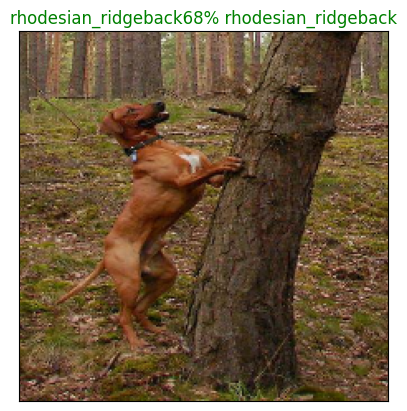

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top predictions. lets make another to visuaize our models top ten predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
 *Prediction probabilities indes
 *Prediction probabilities values
 *prediction labels
* Plot the top 10 prediction probability values and labels, colouring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth labels for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the prediction label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confdence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top ten prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 pediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

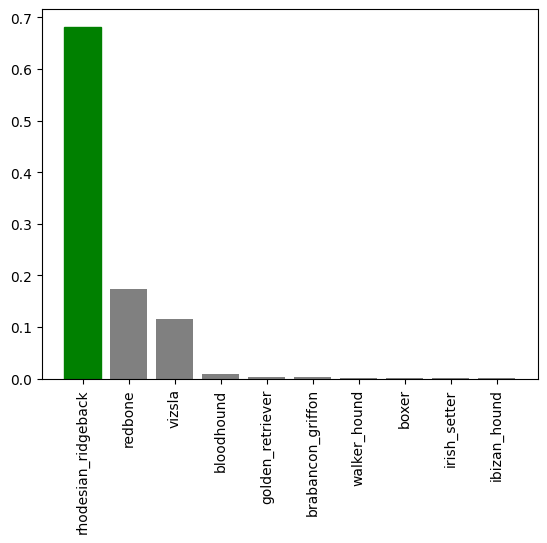

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
          labels=val_labels,
          n=77)

In [ ]:
predictions[0]

array([3.7529929e-08, 1.1402287e-09, 2.5924626e-06, 2.4792640e-10,
       1.4909475e-07, 6.4438666e-08, 1.7719374e-07, 2.2803032e-08,
       3.1972407e-09, 9.9259463e-09, 8.3955740e-08, 1.1427981e-07,
       1.1076341e-08, 1.9847957e-09, 1.0213461e-09, 5.5050564e-09,
       2.1118389e-07, 1.5108170e-09, 1.5519346e-07, 2.3162998e-09,
       4.3644707e-07, 6.6275829e-10, 7.4905397e-09, 1.3667977e-06,
       8.6080192e-09, 4.1139296e-09, 2.0235021e-07, 1.9366160e-08,
       4.4029179e-08, 6.0652525e-08, 1.6856721e-06, 8.0448608e-08,
       3.7463487e-08, 2.9898098e-05, 1.9800162e-09, 2.1667498e-07,
       5.2153972e-08, 3.5043247e-08, 1.0627503e-07, 6.0837257e-10,
       8.1468308e-09, 4.0476009e-09, 6.6478809e-09, 9.7335572e-08,
       1.6157532e-08, 4.4156061e-09, 5.5779486e-07, 5.6698588e-09,
       6.8749118e-09, 1.1701536e-08, 1.5702799e-08, 1.2641553e-07,
       8.6220730e-08, 1.3547404e-08, 1.1422871e-05, 4.5679189e-09,
       5.9173416e-08, 8.1950819e-09, 1.3728179e-07, 1.9716970e

In [ ]:
# top 10 indexes of predictions[0] in descending order [::-1]
[predictions[0].argsort()[-10:][::-1]]

[array([ 62,  99,  87,  97,  33,  54,  94,  71,  95, 105])]

In [ ]:
# index of the the highest prediction
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([9.9975997e-01, 6.3912048e-05, 5.7556714e-05, 4.1715077e-05,
       2.9898098e-05, 1.1422871e-05, 4.9154041e-06, 4.2616753e-06,
       3.6341660e-06, 3.3653323e-06], dtype=float32)

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['keeshond', 'shetland_sheepdog', 'pomeranian',
       'scottish_deerhound', 'collie', 'groenendael', 'samoyed',
       'malamute', 'schipperke', 'standard_poodle'], dtype=object)

In [ ]:
predictions[0].max()

0.99976

Now we've got some predictions to help us visualize our predictions and evaluate our model, lets check out a few

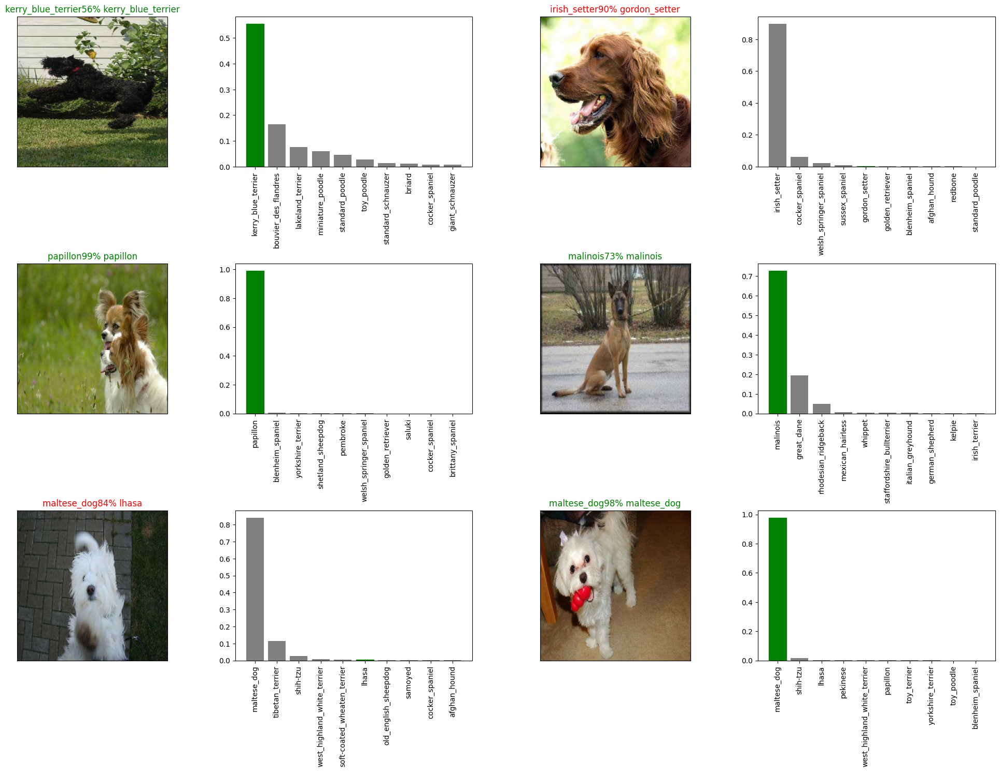

In [ ]:
# let's check out a few predictions and their different values
i_multiplier = 30
num_rows=3
num_cols=2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# create a function to save a model
def save_model(model, suffix=None):
  """
  saves a given model in a models dictionary and appends a suffix (string).
  """
  # Create a model dictionary pathname with current time
  modeldir = os.path.join('drive/My Drive/Dog Vision/models',
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir +"-"+suffix+'.h5' # save the format of the model
  print(f'saving model to:{model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Now we've got functions to save and load amodel.

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

saving model to:drive/My Drive/Dog Vision/models/20230919-07261695108408-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20230919-07261695108408-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20230918-09311695029518-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20230918-09311695029518-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

57/57 [==============================] - 5s 95ms/step - loss: 0.7153 - accuracy: 0.7956


[0.7153193354606628, 0.7955555319786072]

In [ ]:
# Evaluate the loaed model
loaded_1000_image_model.evaluate(val_data)

57/57 [==============================] - 7s 101ms/step - loss: 0.7118 - accuracy: 0.7911


[0.7118279337882996, 0.7911111116409302]

# Training a dog model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
X_train[:10]

['drive/My Drive/Dog Vision/train/9f70486e63ac01868d87763df94226ec.jpg',
 'drive/My Drive/Dog Vision/train/1242da788ce85d4311e1cc9922a0a809.jpg',
 'drive/My Drive/Dog Vision/train/5dc913ed57f4ddb46db2d5e579fca853.jpg',
 'drive/My Drive/Dog Vision/train/c4438c44317572f7a432469a63203819.jpg',
 'drive/My Drive/Dog Vision/train/4927ede09ce508a92f4e38f8360df14e.jpg',
 'drive/My Drive/Dog Vision/train/ab04c82dada7f9657782b29695a7c36b.jpg',
 'drive/My Drive/Dog Vision/train/62516296f5e073a761cf2d1de56518b3.jpg',
 'drive/My Drive/Dog Vision/train/85b160a087cbc927454fe01c52605112.jpg',
 'drive/My Drive/Dog Vision/train/544dcc6d81190416abfcaa1cbf9c978b.jpg',
 'drive/My Drive/Dog Vision/train/3df5455f16086f057418ffe837289b8d.jpg']

In [ ]:
# The model trained on 7200 images
len(X_train)

7200

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# cREATE A DATA BATCH WITH THE FUll dataset
full_data = create_data_batches(X, y)

Creating training data batches....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data , so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

In [ ]:
# fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])


Epoch 1/100
320/320 [==============================] - 40s 112ms/step - loss: 1.3283 - accuracy: 0.6711
Epoch 2/100
320/320 [==============================] - 31s 98ms/step - loss: 0.4021 - accuracy: 0.8835
Epoch 3/100
320/320 [==============================] - 31s 97ms/step - loss: 0.2371 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 30s 95ms/step - loss: 0.1542 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 30s 92ms/step - loss: 0.1059 - accuracy: 0.9795
Epoch 6/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0784 - accuracy: 0.9849
Epoch 7/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0579 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0460 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 29s 92ms/step - loss: 0.0380 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 30s 94ms/step - 

In [ ]:
save_model(full_model, suffix='full-image-set-mobilentev2-Adam')

saving model to:drive/My Drive/Dog Vision/models/20230919-04291695097771-full-image-set-mobilentev2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230919-04291695097771-full-image-set-mobilentev2-Adam.h5'

In [ ]:
# Loading the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20230919-04291695097771-full-image-set-mobilentev2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20230919-04291695097771-full-image-set-mobilentev2-Adam.h5


In [ ]:
len(X)

10222

## Maiking predictions on the test dataset
since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we'll have to get it into the same formar.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and cover them into tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `crate_data_batches()` and settinfg the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make a prediction array by passing the test batches to the predict() method called on our model.



In [ ]:
# Load test image filenames
test_path = 'drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e2844bf76c0ddeae02277d76c31e41f5.jpg',
 'drive/MyDrive/Dog Vision/test/e721c3eec5951861bf3ed7f40ef8b091.jpg',
 'drive/MyDrive/Dog Vision/test/e3c97ed588b32f49c7aae65cf91f17ba.jpg',
 'drive/MyDrive/Dog Vision/test/e1f4d57ee24b11a0d1a24b83e12d6bb7.jpg',
 'drive/MyDrive/Dog Vision/test/de5496c6b58f66ab890ab24087d9e220.jpg',
 'drive/MyDrive/Dog Vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Dog Vision/test/e699b20911a55abda3558c5bcd37443d.jpg',
 'drive/MyDrive/Dog Vision/test/df7d17082d1b25eeba9be835a150db01.jpg',
 'drive/MyDrive/Dog Vision/test/def9a16cb97a7cdd10d6465d642f6bf4.jpg',
 'drive/MyDrive/Dog Vision/test/dce8d03553ab29570f67a28bf0ee0709.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an 1hr)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1185s 4s/step


In [ ]:
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=',')

In [ ]:
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=',')

In [ ]:
test_predictions[:10]

array([[1.30227968e-12, 2.35631712e-15, 2.15246827e-15, ...,
        1.67454459e-06, 3.89958031e-11, 4.86615281e-09],
       [5.24114263e-09, 2.73856404e-05, 2.95718727e-11, ...,
        4.23649241e-11, 3.80933618e-10, 8.30550975e-11],
       [8.94445693e-05, 9.65276886e-11, 7.70301115e-11, ...,
        1.90762545e-11, 2.06242068e-09, 1.79171001e-11],
       ...,
       [5.90726010e-11, 9.12766932e-13, 5.81730575e-08, ...,
        1.70483397e-12, 6.33720298e-11, 4.39286411e-13],
       [1.29957102e-12, 2.00174188e-09, 2.46977150e-09, ...,
        2.67564217e-11, 9.86141615e-13, 1.36471556e-09],
       [2.36244428e-08, 5.70935877e-12, 4.38328237e-12, ...,
        7.45981749e-11, 1.12153302e-07, 1.09630360e-10]])

In [ ]:
# (10357, 120) we have 10357 test images and each one of them has 120 prediction probabilities (names)
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for kaggle
Looking at the kaggle sample submission, we find that it wants our models prediction probability outputs in a Dataframe with an ID column and a column for each differnent dog breed.
https://www.kaggle.com/competitions/dog-breed-identification/overview#:~:text=For%20each%20image%C2%A0in%20the%20test%20set%2C%20you%20must%20predict%20a%20probability%20for%20each%20of%20the%20different%20breeds.%20The%20file%20should%20contain%20a%20header%20and%20have%20the%20following%20format%3A
To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to kaggle

In [ ]:
['id'] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
# create a pandas Dataframe with empty columns
preds_df = pd.DataFrame(columns=['id']+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames[0]

'drive/MyDrive/Dog Vision/test/e2844bf76c0ddeae02277d76c31e41f5.jpg'

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog Vision/test/e2844bf76c0ddeae02277d76c31e41f5', '.jpg')

In [ ]:
preds_df['id']

0        e2844bf76c0ddeae02277d76c31e41f5
1        e721c3eec5951861bf3ed7f40ef8b091
2        e3c97ed588b32f49c7aae65cf91f17ba
3        e1f4d57ee24b11a0d1a24b83e12d6bb7
4        de5496c6b58f66ab890ab24087d9e220
                       ...               
10352    0716352373a28d687d5df097512c5374
10353    08d5f16507943be640f4592c9d08a798
10354    079e0634a90b3de0e5c799dda0ca8fd3
10355    07ad1a0d014793de8c2e104b801c6cda
10356    07217f9dab968cf02c4cb37acf2acc28
Name: id, Length: 10357, dtype: object

In [ ]:
# Append test Image ID's to predictions Dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2844bf76c0ddeae02277d76c31e41f5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e721c3eec5951861bf3ed7f40ef8b091,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e3c97ed588b32f49c7aae65cf91f17ba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1f4d57ee24b11a0d1a24b83e12d6bb7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,de5496c6b58f66ab890ab24087d9e220,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2844bf76c0ddeae02277d76c31e41f5,1.302280e-12,2.356317e-15,2.152468e-15,7.922689e-16,1.733917e-11,5.339998e-10,8.713969e-14,3.332725e-09,9.767666e-12,...,1.904176e-07,1.923863e-04,6.695823e-15,3.729077e-15,3.090766e-10,2.619733e-11,2.292735e-14,1.674545e-06,3.899580e-11,4.866153e-09
1,e721c3eec5951861bf3ed7f40ef8b091,5.241143e-09,2.738564e-05,2.957187e-11,2.164190e-10,2.579712e-08,1.751960e-10,4.389010e-11,2.441611e-09,4.732499e-11,...,1.151773e-07,1.540923e-10,2.113082e-09,9.553382e-08,4.215182e-07,1.548428e-09,9.189299e-10,4.236492e-11,3.809336e-10,8.305510e-11
2,e3c97ed588b32f49c7aae65cf91f17ba,8.944457e-05,9.652769e-11,7.703011e-11,1.732623e-09,1.410248e-07,1.245669e-07,1.492448e-11,3.336788e-10,5.630097e-08,...,4.391166e-09,6.016058e-11,1.288731e-09,6.635760e-12,2.893825e-10,4.628202e-10,5.450617e-11,1.907625e-11,2.062421e-09,1.791710e-11
3,e1f4d57ee24b11a0d1a24b83e12d6bb7,3.613789e-07,2.660689e-08,5.564491e-06,4.795001e-05,5.192536e-06,6.556735e-10,1.849296e-03,2.536562e-06,2.241998e-05,...,2.479254e-06,6.742970e-06,1.144996e-07,4.872847e-07,2.242388e-08,8.653034e-08,6.870985e-04,3.147625e-06,4.899607e-04,8.035549e-06
4,de5496c6b58f66ab890ab24087d9e220,2.929294e-11,5.087021e-04,3.937659e-09,5.288089e-05,4.869856e-10,3.090075e-08,1.465689e-10,1.762662e-10,1.396605e-08,...,1.483894e-11,3.351635e-12,8.468899e-12,1.336696e-06,7.683651e-09,3.510036e-10,1.371711e-09,1.782408e-06,2.018263e-07,2.371242e-11


In [ ]:
# Save our predictions dataframe to csv for submissions to kaggle
preds_df.to_csv('drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv',
                index=False)

## Making predictions on custom images

To Make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And sicne our custom images wont have labels, we se the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
import os
custom_path = 'drive/My Drive/Dog Vision/my-dog-photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/images.jpeg',
 'drive/My Drive/Dog Vision/my-dog-photos/32569077_MzAwLTQwMC0zYzIyYTEwMDk3.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/images (1).jpeg']

In [ ]:
# turn custom images to batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 725ms/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['weimaraner', 'german_shepherd', 'rhodesian_ridgeback']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix thus later
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

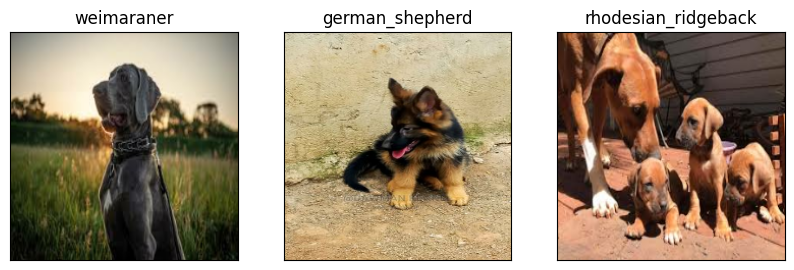

In [ ]:
# Check custom image predictions
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)